## Required Libraries

In [3]:
import os
import cv2
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from collections import defaultdict
from skimage.filters import frangi
from skimage.color import rgb2gray
from skimage import img_as_float
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, EfficientNetB0
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import keras_tuner as kt
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input

## Loading the dataset

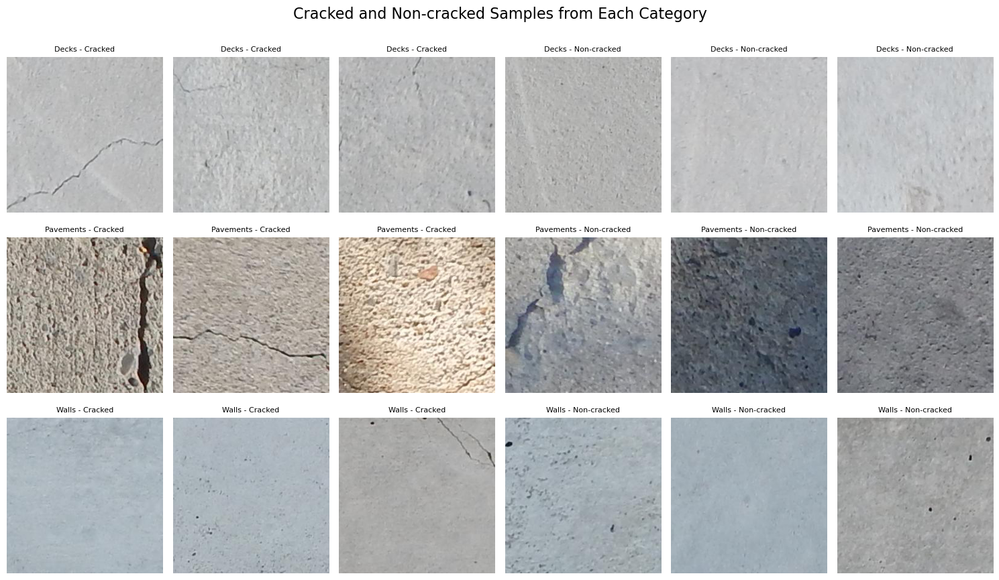

In [1]:
# Dataset structure
dataset_path = './Dataset'
categories = ['Decks', 'Pavements', 'Walls']
classes = ['Cracked', 'Non-cracked']

# Plotting setup
fig, axes = plt.subplots(len(categories), len(classes) * 3, figsize=(15, 9))
fig.suptitle('Cracked and Non-cracked Samples from Each Category', fontsize=16)

# Loop through categories and classes
for i, category in enumerate(categories):
    for j, cls in enumerate(classes):
        class_path = os.path.join(dataset_path, category, cls)
        images = os.listdir(class_path)
        sample_images = random.sample(images, 3)  # Pick 3 random images

        for k, image_name in enumerate(sample_images):
            image_path = os.path.join(class_path, image_name)
            image = Image.open(image_path)
            ax = axes[i, j * 3 + k]
            ax.imshow(image, cmap='gray')
            ax.axis('off')
            ax.set_title(f'{category} - {cls}', fontsize=8)

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

## EDA of the dataset
### 1.Class Distribution of the dataset 

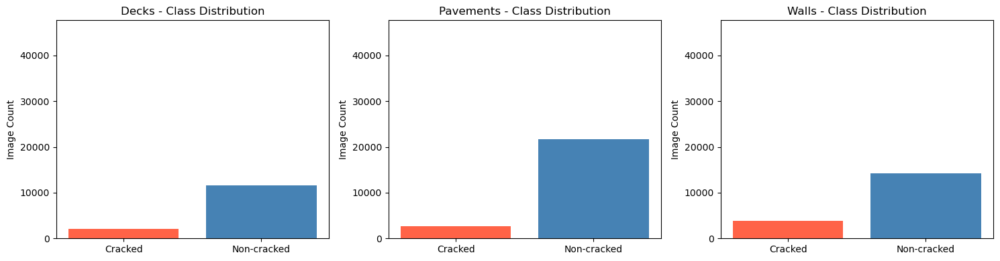

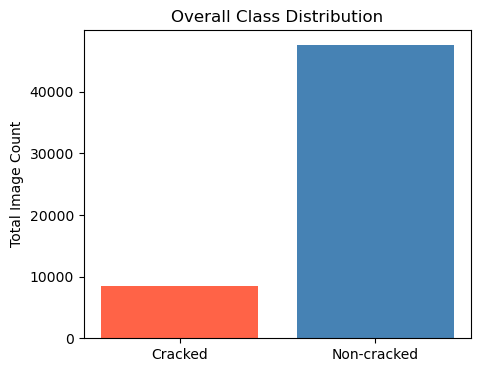

In [3]:
# Store counts
distribution = {cat: {cls: 0 for cls in classes} for cat in categories}
overall = {'Cracked': 0, 'Non-cracked': 0}

# Count images in each folder
for category in categories:
    for cls in classes:
        folder_path = os.path.join(dataset_path, category, cls)
        count = len(os.listdir(folder_path))
        distribution[category][cls] = count
        overall[cls] += count

# --- Plotting by category ---
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
for idx, category in enumerate(categories):
    axs[idx].bar(distribution[category].keys(), distribution[category].values(), color=['tomato', 'steelblue'])
    axs[idx].set_title(f'{category} - Class Distribution')
    axs[idx].set_ylabel('Image Count')
    axs[idx].set_ylim(0, max(max(overall.values()), 1) + 100)

plt.tight_layout()
plt.show()

# --- Plotting overall distribution ---
plt.figure(figsize=(5, 4))
plt.bar(overall.keys(), overall.values(), color=['tomato', 'steelblue'])
plt.title('Overall Class Distribution')
plt.ylabel('Total Image Count')
plt.show()


### 2. Pixel Intensity of the dataset

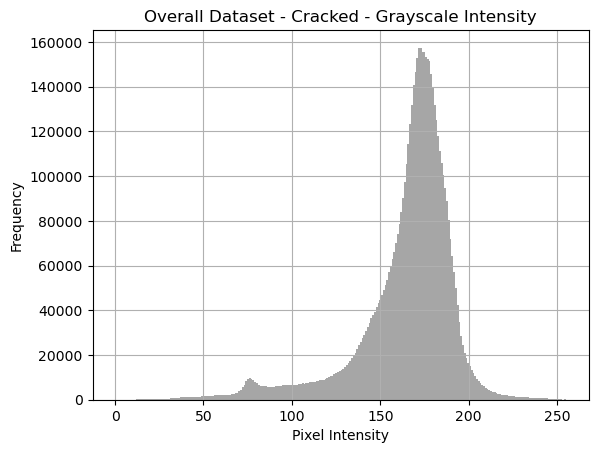

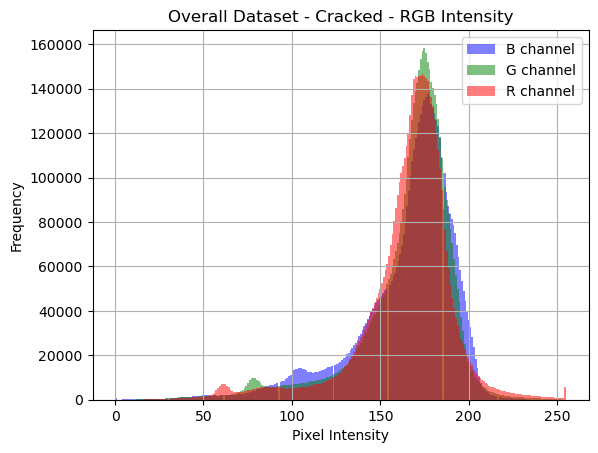

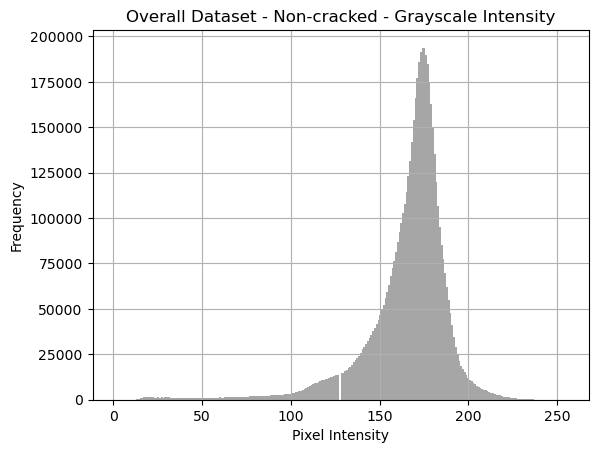

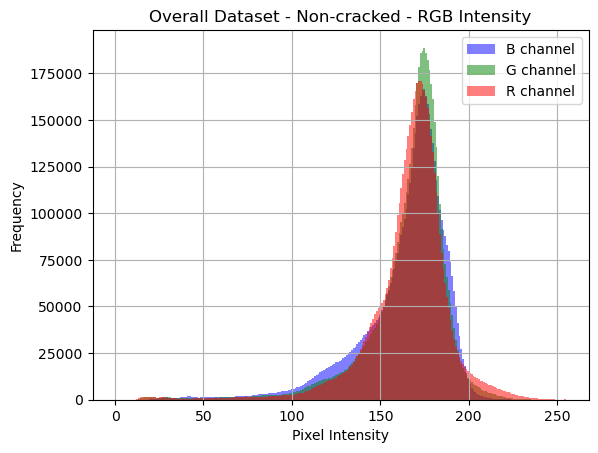

In [6]:
sample_size = 30  

def collect_image_paths():
    image_paths = {'Cracked': [], 'Non-cracked': []}
    for category in categories:
        for cls in classes:
            folder = os.path.join(dataset_path, category, cls)
            files = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith('.jpg')]
            sampled = random.sample(files, min(sample_size, len(files)))
            image_paths[cls].extend(sampled)
    return image_paths

def plot_histogram(image_paths, cls_label, color_mode='grayscale'):
    all_pixels = []

    for path in image_paths:
        if color_mode == 'grayscale':
            img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        else:
            img = cv2.imread(path)  # BGR
        if img is not None:
            all_pixels.append(img)

    if color_mode == 'grayscale':
        pixel_values = np.concatenate([img.flatten() for img in all_pixels])
        plt.hist(pixel_values, bins=256, color='gray', alpha=0.7)
        plt.title(f"{cls_label} - Grayscale Intensity")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.grid(True)
        plt.show()

    elif color_mode == 'rgb':
        color_map = ('b', 'g', 'r')
        for i, col in enumerate(color_map):
            pixel_values = np.concatenate([img[:, :, i].flatten() for img in all_pixels])
            plt.hist(pixel_values, bins=256, color=col, alpha=0.5, label=f'{col.upper()} channel')
        plt.title(f"{cls_label} - RGB Intensity")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.legend()
        plt.grid(True)
        plt.show()

# Collect paths from all categories
all_image_paths = collect_image_paths()

# Plot for each class
for cls in classes:
    plot_histogram(all_image_paths[cls], f"Overall Dataset - {cls}", color_mode='grayscale')
    plot_histogram(all_image_paths[cls], f"Overall Dataset - {cls}", color_mode='rgb')


### 3. Contrast Distribution

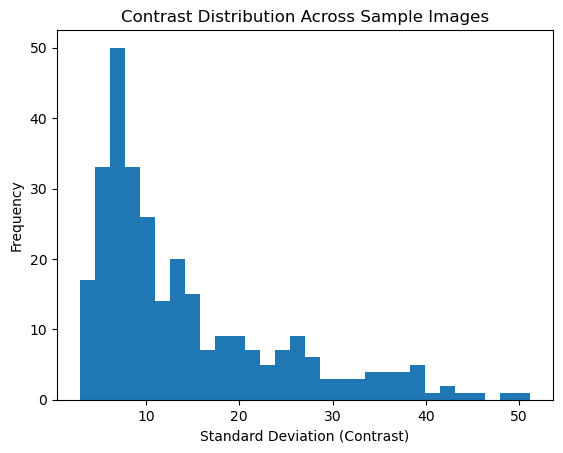

In [6]:
def compute_contrast(img):
    return img.std()

contrasts = []
for category in categories:
    for cls in classes:
        path = os.path.join(dataset_path, category, cls)
        for img_name in random.sample(os.listdir(path), 50):  # Sample 50
            img = cv2.imread(os.path.join(path, img_name), cv2.IMREAD_GRAYSCALE)
            contrasts.append(compute_contrast(img))

plt.hist(contrasts, bins=30)
plt.title("Contrast Distribution Across Sample Images")
plt.xlabel("Standard Deviation (Contrast)")
plt.ylabel("Frequency")
plt.show()

### 4. Edge Density

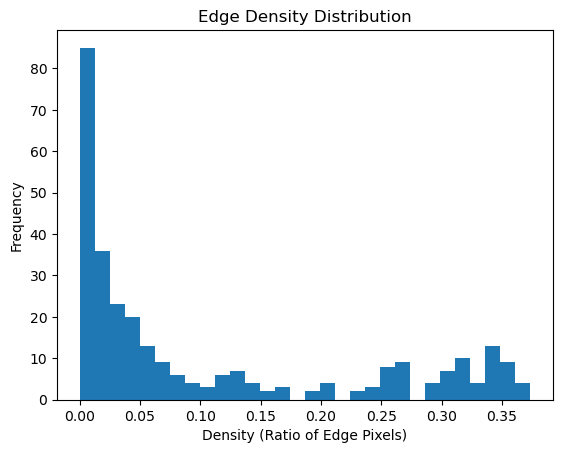

In [7]:
def edge_density(img):
    edges = cv2.Canny(img, 50, 150)
    return np.sum(edges > 0) / edges.size

densities = []
for category in categories:
    for cls in classes:
        path = os.path.join(dataset_path, category, cls)
        for img_name in random.sample(os.listdir(path), 50):
            img = cv2.imread(os.path.join(path, img_name), cv2.IMREAD_GRAYSCALE)
            densities.append(edge_density(img))

plt.hist(densities, bins=30)
plt.title("Edge Density Distribution")
plt.xlabel("Density (Ratio of Edge Pixels)")
plt.ylabel("Frequency")
plt.show()

### 5. PCA 

Data shape: (200, 4096)


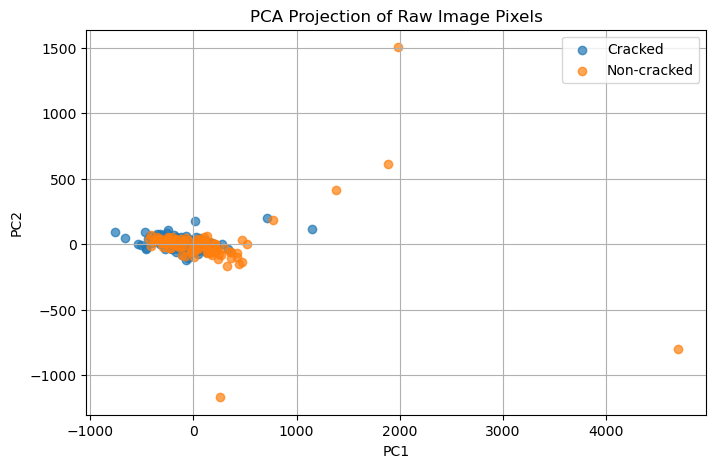

In [8]:
# Parameters
dataset_path = './Dataset'
categories = ['Decks', 'Pavements', 'Walls']
classes = ['Cracked', 'Non-cracked']
img_size = (64, 64) 

# Data holders
images = []
labels = []

# Load 100 cracked and 100 non-cracked images from all categories
max_per_class = 100
for cls_index, cls in enumerate(classes):
    count = 0
    for category in categories:
        class_path = os.path.join(dataset_path, category, cls)
        for img_name in os.listdir(class_path):
            if count >= max_per_class:
                break
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            img = cv2.resize(img, img_size)
            images.append(img.flatten())
            labels.append(cls_index)
            count += 1

X = np.array(images)
y = np.array(labels)

print("Data shape:", X.shape)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8, 5))
plt.scatter(X_pca[y == 0, 0], X_pca[y == 0, 1], label='Cracked', alpha=0.7)
plt.scatter(X_pca[y == 1, 0], X_pca[y == 1, 1], label='Non-cracked', alpha=0.7)
plt.title('PCA Projection of Raw Image Pixels')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.grid(True)
plt.show()

## Data Processing of the dataset
### 1. CLAHE preprocessing

In [70]:
# Dataset path
dataset_path = './Dataset'
categories = ['Decks', 'Pavements', 'Walls']
classes = ['Cracked', 'Non-cracked']
img_size = (256, 256)

# Function to apply CLAHE in LAB color space
def apply_clahe_lab(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)

### Hyperparameter tuning of CLAHE 

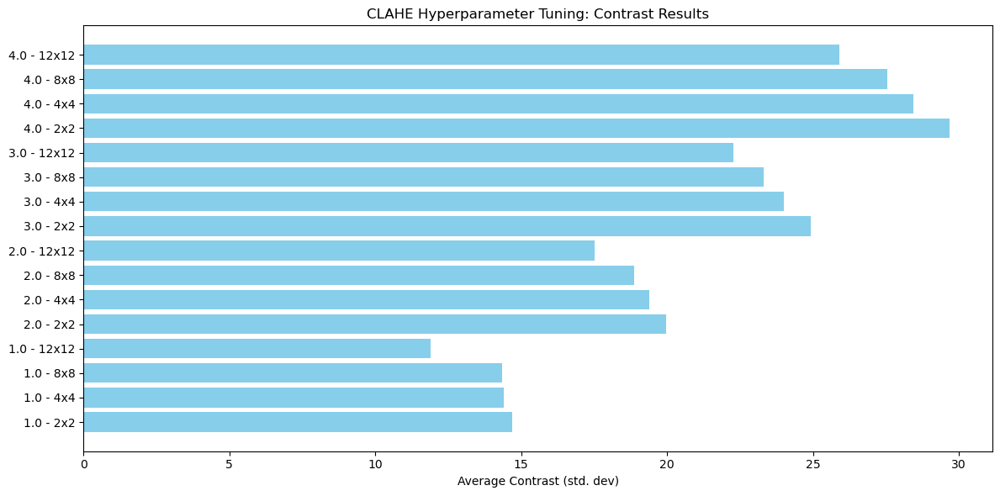

(4.0, (2, 2))

In [22]:
# Function to compute contrast
def compute_contrast(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return gray.std()

# Tune hyperparameters
best_contrast = 0
best_params = (2.0, (8, 8))

clip_limits = [1.0, 2.0, 3.0, 4.0]
tile_grid_sizes = [(2,2),  (4, 4), (8, 8), (12, 12)]

# Use 10 random images from all categories and classes
sample_images = []
for category in categories:
    for cls in classes:
        path = os.path.join(dataset_path, category, cls)
        images = random.sample(os.listdir(path), 2)
        for img_name in images:
            img_path = os.path.join(path, img_name)
            img = cv2.imread(img_path)
            img = cv2.resize(img, img_size)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            sample_images.append(img_rgb)

# Try different hyperparameter combinations
for clip in clip_limits:
    for grid in tile_grid_sizes:
        total_contrast = 0
        for img in sample_images:
            clahe_img = apply_clahe_lab(img, clip, grid)
            total_contrast += compute_contrast(clahe_img)
        avg_contrast = total_contrast / len(sample_images)
        if avg_contrast > best_contrast:
            best_contrast = avg_contrast
            best_params = (clip, grid)

# For plotting average contrast per parameter setting
contrast_results = []

# Try different hyperparameter combinations again for visualization
for clip in clip_limits:
    for grid in tile_grid_sizes:
        total_contrast = 0
        for img in sample_images:
            clahe_img = apply_clahe_lab(img, clip, grid)
            total_contrast += compute_contrast(clahe_img)
        avg_contrast = total_contrast / len(sample_images)
        contrast_results.append({
            'clipLimit': clip,
            'tileGridSize': f"{grid[0]}x{grid[1]}",
            'avg_contrast': avg_contrast
        })

# Organize data for plotting
clip_tile_labels = [f"{r['clipLimit']} - {r['tileGridSize']}" for r in contrast_results]
contrast_values = [r['avg_contrast'] for r in contrast_results]

# Plot
plt.figure(figsize=(12, 6))
plt.barh(clip_tile_labels, contrast_values, color='skyblue')
plt.xlabel("Average Contrast (std. dev)")
plt.title("CLAHE Hyperparameter Tuning: Contrast Results")
plt.tight_layout()
plt.show()
best_params

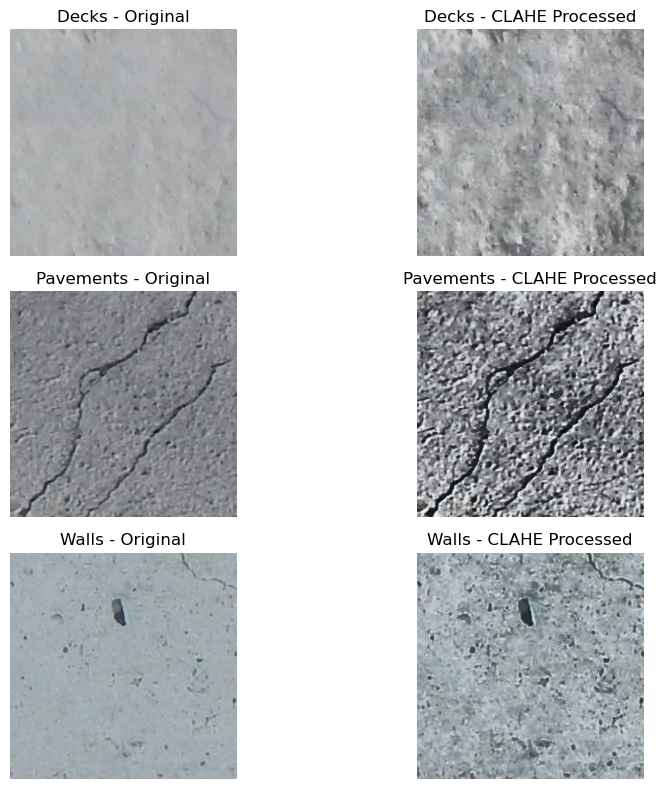

In [23]:
# Apply best CLAHE and visualize before/after from each category
visualization_samples = []

for category in categories:
    path = os.path.join(dataset_path, category, 'Cracked')
    img_name = random.choice(os.listdir(path))
    img_path = os.path.join(path, img_name)
    img = cv2.imread(img_path)
    img = cv2.resize(img, img_size)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    clahe_img = apply_clahe_lab(img_rgb, best_params[0], best_params[1])
    visualization_samples.append((category, img_rgb, clahe_img))

# Plot results
fig, axes = plt.subplots(len(visualization_samples), 2, figsize=(10, 8))
for i, (cat, original, processed) in enumerate(visualization_samples):
    axes[i, 0].imshow(original)
    axes[i, 0].set_title(f'{cat} - Original')
    axes[i, 0].axis('off')
    axes[i, 1].imshow(processed)
    axes[i, 1].set_title(f'{cat} - CLAHE Processed')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

## 2. Hessian Filtering preprocessing

In [59]:
# Hessian filtering function using correct parameters
def apply_hessian(image, scale_range, beta, gamma):
    gray = rgb2gray(image)
    float_img = img_as_float(gray)
    return frangi(float_img, scale_range=scale_range, beta=beta, gamma=gamma)

# Apply overlay
def apply_hessian_overlay(image_rgb, scale_range, beta, gamma):
    gray = rgb2gray(image_rgb)
    float_img = img_as_float(gray)
    hessian = frangi(float_img, scale_range=scale_range, beta=beta, gamma=gamma)
    hessian_norm = cv2.normalize(hessian, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    hessian_color = cv2.applyColorMap(hessian_norm, cv2.COLORMAP_JET)
    hessian_color = cv2.cvtColor(hessian_color, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(image_rgb, 0.7, hessian_color, 0.5, 0)
    return overlay

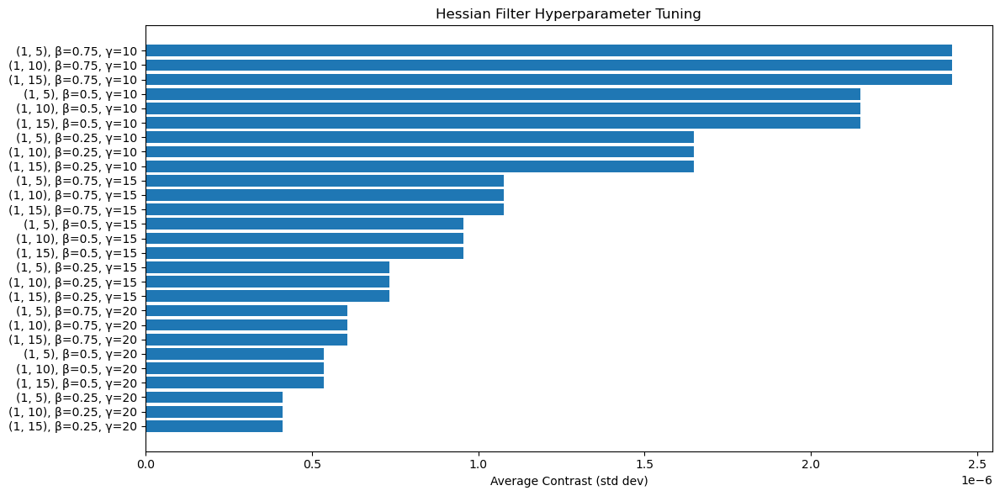

Best Parameters:
Scale range: (1, 5), β: 0.75, γ: 10


In [41]:
# Sample image loader (load 1 cracked image per category)
def load_sample_images(dataset_path, categories):
    images = []
    for cat in categories:
        cracked_dir = os.path.join(dataset_path, cat, 'Cracked')
        if os.path.isdir(cracked_dir):
            file_list = [f for f in os.listdir(cracked_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
            if file_list:
                path = os.path.join(cracked_dir, file_list[0])
                img = cv2.imread(path)
                img = cv2.resize(img, (256, 256))
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                images.append((cat, img_rgb))
    return images

# Contrast metric (std. dev of Hessian output)
def compute_contrast(image):
    return np.std(image)

# Dataset setup
dataset_path = './Dataset'
categories = ['Decks', 'Pavements', 'Walls']
sample_images = load_sample_images(dataset_path, categories)

# Parameters to tune
scale_ranges = [(1, 5), (1, 10), (1, 15)]
beta_values = [0.25, 0.5, 0.75]
gamma_values = [10, 15, 20]

# Tuning loop
results = []
for scale in scale_ranges:
    for beta in beta_values:
        for gamma in gamma_values:
            contrast_scores = []
            for cat, img in sample_images:
                filtered = apply_hessian(img, scale_range=scale, beta=beta, gamma=gamma)
                contrast_scores.append(compute_contrast(filtered))
            avg_contrast = np.mean(contrast_scores)
            results.append({
                'scale_range': scale,
                'beta': beta,
                'gamma': gamma,
                'avg_contrast': avg_contrast
            })

# Sort and find best
results.sort(key=lambda x: x['avg_contrast'], reverse=True)
best = results[0]

# Plot results
labels = [f"{r['scale_range']}, β={r['beta']}, γ={r['gamma']}" for r in results]
values = [r['avg_contrast'] for r in results]

plt.figure(figsize=(12, 6))
plt.barh(labels, values)
plt.xlabel('Average Contrast (std dev)')
plt.title('Hessian Filter Hyperparameter Tuning')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Print best combination
print("Best Parameters:")
print(f"Scale range: {best['scale_range']}, β: {best['beta']}, γ: {best['gamma']}")

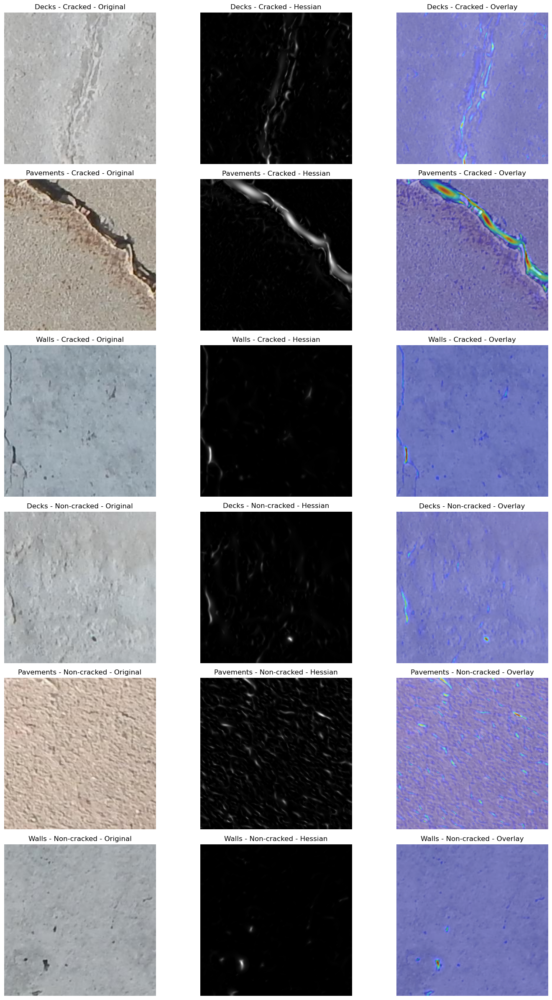

In [62]:
# Best parameters from Hessian tuning
best_scale = (1, 5)
best_beta = 0.75
best_gamma = 10

def load_cracked_noncracked_samples(dataset_path, categories):
    cracked_samples = []
    noncracked_samples = []
    for cat in categories:
        for cls, target_list in [('Cracked', cracked_samples), ('Non-cracked', noncracked_samples)]:
            class_dir = os.path.join(dataset_path, cat, cls)
            if os.path.isdir(class_dir):
                file_list = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
                if file_list:
                    img_name = random.choice(file_list)  
                    img_path = os.path.join(class_dir, img_name)
                    img = cv2.imread(img_path)
                    if img is not None:
                        img = cv2.resize(img, (256, 256))
                        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                        target_list.append((f"{cat} - {cls}", img_rgb))
    return cracked_samples + noncracked_samples


sample_images = load_cracked_noncracked_samples(dataset_path, categories)

# Plot results
fig, axes = plt.subplots(len(sample_images), 3, figsize=(15, 4 * len(sample_images)))
for i, (label, img_rgb) in enumerate(sample_images):
    hessian_img = apply_hessian(img_rgb,best_scale,best_beta,best_gamma)
    overlay_img = apply_hessian_overlay(img_rgb,best_scale,best_beta,best_gamma)

    axes[i, 0].imshow(img_rgb)
    axes[i, 0].set_title(f'{label} - Original')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(hessian_img, cmap='gray')
    axes[i, 1].set_title(f'{label} - Hessian')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(overlay_img)
    axes[i, 2].set_title(f'{label} - Overlay')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

## Combining Both the algorithms

In [96]:
# Define CLAHE and Hessian functions
def apply_clahe_lab(image, clip_limit=4.0, tile_grid_size=(2, 2)):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)

def apply_hessian_overlay(image_rgb, scale_range=(1, 5), beta=0.75, gamma=10):
    gray = rgb2gray(image_rgb)
    float_img = img_as_float(gray)
    hessian = frangi(float_img, scale_range=scale_range, beta=beta, gamma=gamma)
    hessian_norm = cv2.normalize(hessian, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    hessian_color = cv2.applyColorMap(hessian_norm, cv2.COLORMAP_JET)
    hessian_color = cv2.cvtColor(hessian_color, cv2.COLOR_BGR2RGB)
    return cv2.addWeighted(image_rgb, 0.6, hessian_color, 0.4, 0)

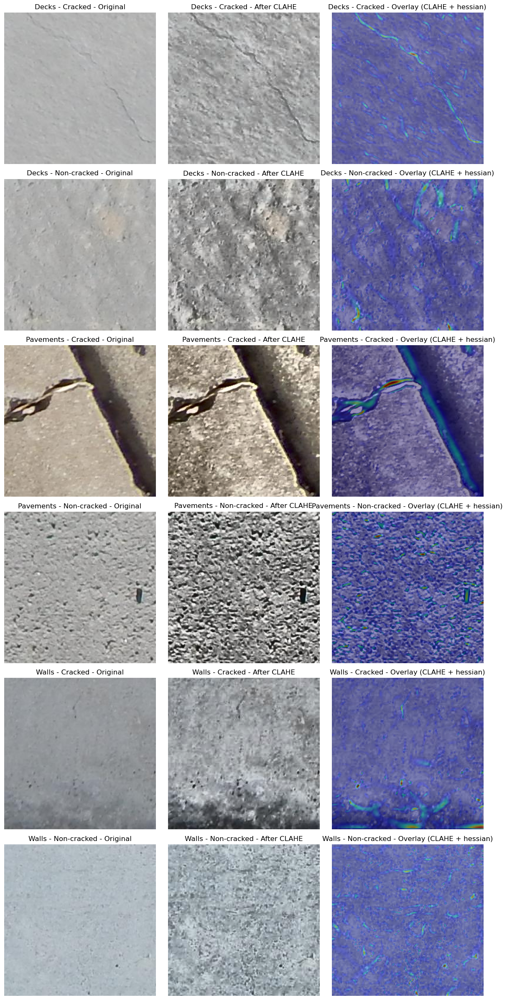

In [98]:
# Load one random image from each category/class and apply preprocessing
samples = []

for category in categories:
    for cls in classes:
        dir_path = os.path.join(dataset_path, category, cls)
        if not os.path.exists(dir_path):
            continue
        files = [f for f in os.listdir(dir_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if files:
            img_name = random.choice(files)
            img_path = os.path.join(dir_path, img_name)
            img = cv2.imread(img_path)
            if img is None:
                continue
            img = cv2.resize(img, img_size)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            clahe_img = apply_clahe_lab(img_rgb)
            overlay_img = apply_hessian_overlay(clahe_img)
            samples.append((f"{category} - {cls}", img_rgb, clahe_img, overlay_img))

# Plot the results
fig, axes = plt.subplots(len(samples), 3, figsize=(12, 4 * len(samples)))
for i, (label, original, clahe, overlay) in enumerate(samples):
    axes[i, 0].imshow(original)
    axes[i, 0].set_title(f'{label} - Original')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(clahe)
    axes[i, 1].set_title(f'{label} - After CLAHE')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(overlay)
    axes[i, 2].set_title(f'{label} - Overlay (CLAHE + hessian)')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

In [65]:
# Parameters
dataset_path = './dataset_new'
output_path = './datapreprocessing'
classes = ['Cracked', 'Non-cracked']
img_size = (256, 256)

# Process each class
for cls in classes:
    input_dir = os.path.join(dataset_path, cls)
    output_dir = os.path.join(output_path, cls)
    os.makedirs(output_dir, exist_ok=True)

    files = [f for f in os.listdir(input_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    print(f"\nProcessing {cls} ({len(files)} images):")

    for file in tqdm(files, desc=f"{cls}"):
        input_path = os.path.join(input_dir, file)
        output_file_path = os.path.join(output_dir, file)

        img = cv2.imread(input_path)
        if img is None:
            continue

        img = cv2.resize(img, img_size)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        clahe_img = apply_clahe_lab(img_rgb)
        overlay_img = apply_hessian_overlay(clahe_img)

        # Save output
        overlay_bgr = cv2.cvtColor(overlay_img, cv2.COLOR_RGB2BGR)
        cv2.imwrite(output_file_path, overlay_bgr)

print("\n All images processed and saved in './datapreprocessing'")


Processing Cracked (8484 images):


Cracked: 100%|█████████████████████████████████████████████████████████████████████| 8484/8484 [12:17<00:00, 11.51it/s]



Processing Non-cracked (47608 images):


Non-cracked: 100%|█████████████████████████████████████████████████████████████| 47608/47608 [1:08:17<00:00, 11.62it/s]


 All images processed and saved in './datapreprocessing'


## Dataset splitting

In [99]:
# Input folders
original_input_dir = './dataset_new'
preprocessed_input_dir = './datapreprocessing'

# Output folders
original_output_dir = './dataset_split'
preprocessed_output_dir = './datapreprocessing_split'

# Split ratios
train_ratio = 0.7
val_ratio = 0.2  

# Classes
classes = ['Cracked', 'Non-cracked']

# Create output directories for both original and preprocessed datasets
for split in ['train', 'val', 'test']:
    for cls in classes:
        os.makedirs(os.path.join(original_output_dir, split, cls), exist_ok=True)
        os.makedirs(os.path.join(preprocessed_output_dir, split, cls), exist_ok=True)

# Split and copy from both folders
for cls in classes:
    cls_dir_original = os.path.join(original_input_dir, cls)
    cls_dir_preprocessed = os.path.join(preprocessed_input_dir, cls)

    files = [f for f in os.listdir(cls_dir_original) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(files) 

    train_end = int(train_ratio * len(files))
    val_end = int((train_ratio + val_ratio) * len(files))

    train_files = files[:train_end]
    val_files = files[train_end:val_end]
    test_files = files[val_end:]

    def copy_files(file_list, split_name):
        for f in file_list:
            # Copy from original
            src_original = os.path.join(cls_dir_original, f)
            dst_original = os.path.join(original_output_dir, split_name, cls, f)
            shutil.copy(src_original, dst_original)

            # Copy from preprocessed
            src_preprocessed = os.path.join(cls_dir_preprocessed, f)
            dst_preprocessed = os.path.join(preprocessed_output_dir, split_name, cls, f)
            shutil.copy(src_preprocessed, dst_preprocessed)

    copy_files(train_files, 'train')
    copy_files(val_files, 'val')
    copy_files(test_files, 'test')

print("Original and preprocessed datasets split into train/val/test successfully with matching file names.")

✅ Original and preprocessed datasets split into train/val/test successfully with matching file names.


## Model Development
### 1. VGG16 Model without preprocessing

In [117]:
base_dir = './dataset_split'
img_size = (224, 224)
batch_size = 32
epochs = 15

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    os.path.join(base_dir, 'train'),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary'
)

val_generator = val_test_datagen.flow_from_directory(
    os.path.join(base_dir, 'val'),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary'
)

test_generator = val_test_datagen.flow_from_directory(
    os.path.join(base_dir, 'test'),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)


labels = train_generator.classes
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(labels),
                                     y=labels)
class_weights_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weights_dict)

Found 39263 images belonging to 2 classes.
Found 11219 images belonging to 2 classes.
Found 5610 images belonging to 2 classes.
Class Weights: {0: 3.306079488043112, 1: 0.5890922730682671}


In [118]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [8]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    class_weight=class_weights_dict
)

Epoch 1/15
1227/1227 [==============================] - 445s 358ms/step - loss: 0.6956 - accuracy: 0.7073 - val_loss: 0.7966 - val_accuracy: 0.6513
Epoch 2/15
1227/1227 [==============================] - 438s 357ms/step - loss: 0.6821 - accuracy: 0.7255 - val_loss: 0.7472 - val_accuracy: 0.6913
Epoch 3/15
1227/1227 [==============================] - 440s 359ms/step - loss: 0.6756 - accuracy: 0.7111 - val_loss: 0.7028 - val_accuracy: 0.7013
Epoch 4/15
1227/1227 [==============================] - 441s 359ms/step - loss: 0.6512 - accuracy: 0.7682 - val_loss: 0.7048 - val_accuracy: 0.7013
Epoch 5/15
1227/1227 [==============================] - 443s 361ms/step - loss: 0.6333 - accuracy: 0.7380 - val_loss: 0.6932 - val_accuracy: 0.7413
Epoch 6/15
1227/1227 [==============================] - 437s 356ms/step - loss: 0.6532 - accuracy: 0.7564 - val_loss: 0.6733 - val_accuracy: 0.7813
Epoch 7/15
1227/1227 [==============================] - 437s 356ms/step - loss: 0.6043 - accuracy: 0.7622 - val_

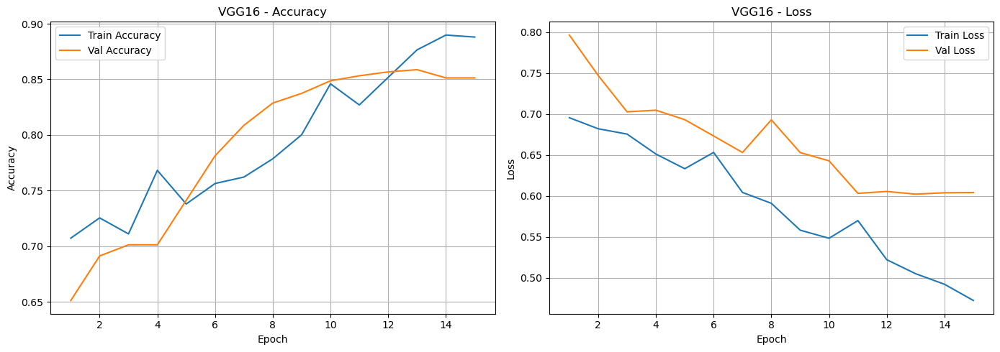

In [3]:
def plot_training_history(history, model_name='Model'):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Train Accuracy')
    plt.plot(epochs_range, val_acc, label='Val Accuracy')
    plt.title(f'{model_name} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Train Loss')
    plt.plot(epochs_range, val_loss, label='Val Loss')
    plt.title(f'{model_name} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()
    
plot_training_history(history, model_name='VGG16')

In [10]:
test_generator.reset()
preds = model.predict(test_generator)
y_pred = (preds > 0.5).astype(int)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print("Classification Report on Test Set:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

176/176 [==============================] - 42s 237ms/step
Classification Report on Test Set:

              precision    recall  f1-score   support

     Cracked       0.70      0.74      0.72       849
 Non-cracked       0.95      0.91      0.93      4761

    accuracy                           0.87      5610
   macro avg       0.82      0.82      0.82      5610
weighted avg       0.88      0.87      0.87      5610


In [11]:
import time
import tracemalloc
import psutil
import os

def evaluate_inference_performance(model, test_generator):
    test_generator.reset()

    # Start timers and memory trackers
    start_time = time.time()
    tracemalloc.start()
    process = psutil.Process(os.getpid())
    before_mem = process.memory_info().rss

    # Perform prediction
    _ = model.predict(test_generator)

    # End measurements
    end_time = time.time()
    after_mem = process.memory_info().rss
    current, peak = tracemalloc.get_traced_memory()
    tracemalloc.stop()

    # Calculate metrics
    elapsed_time = end_time - start_time
    num_samples = test_generator.samples
    time_per_image = elapsed_time / num_samples
    mem_used_psutil = (after_mem - before_mem) / 1024 / 1024  # MB
    mem_peak_tracemalloc = peak / 1024 / 1024  # MB
    # Print metrics
    print(f"\n Inference Performance Summary:")
    print(f"Total prediction time     : {elapsed_time:.2f} seconds")
    print(f"Average time per image    : {time_per_image:.4f} seconds/image")
    print(f"Memory used (psutil)      : {mem_used_psutil:.2f} MB")
    print(f"Peak memory (tracemalloc) : {mem_peak_tracemalloc:.2f} MB")

evaluate_inference_performance(model, test_generator)

176/176 [==============================] - 42s 238ms/step

 Inference Performance Summary:
Total prediction time     : 51.99 seconds
Average time per image    : 0.0085 seconds/image
Memory used (psutil)      : 0.21 MB
Peak memory (tracemalloc) : 75.92 MB


### 2. EfficientNet Model without preprocessing

In [123]:
from tensorflow.keras.applications import EfficientNetB0
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

16705208/16705208 [==============================] - 3s 0us/step


In [12]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    class_weight=class_weights_dict
)

Epoch 1/15
1227/1227 [==============================] - 425s 348ms/step - loss: 0.6522 - accuracy: 0.7532 - val_loss: 0.7066 - val_accuracy: 0.7232
Epoch 2/15
1227/1227 [==============================] - 428s 347ms/step - loss: 0.6029 - accuracy: 0.7736 - val_loss: 0.7172 - val_accuracy: 0.7582
Epoch 3/15
1227/1227 [==============================] - 420s 349ms/step - loss: 0.5786 - accuracy: 0.7856 - val_loss: 0.6792 - val_accuracy: 0.7726
Epoch 4/15
1227/1227 [==============================] - 431s 349ms/step - loss: 0.5912 - accuracy: 0.7912 - val_loss: 0.6032 - val_accuracy: 0.7812
Epoch 5/15
1227/1227 [==============================] - 443s 341ms/step - loss: 0.6033 - accuracy: 0.7733 - val_loss: 0.6200 - val_accuracy: 0.8239
Epoch 6/15
1227/1227 [==============================] - 427s 346ms/step - loss: 0.6026 - accuracy: 0.8226 - val_loss: 0.5927 - val_accuracy: 0.8432
Epoch 7/15
1227/1227 [==============================] - 427s 346ms/step - loss: 0.5627 - accuracy: 0.8627 - val_

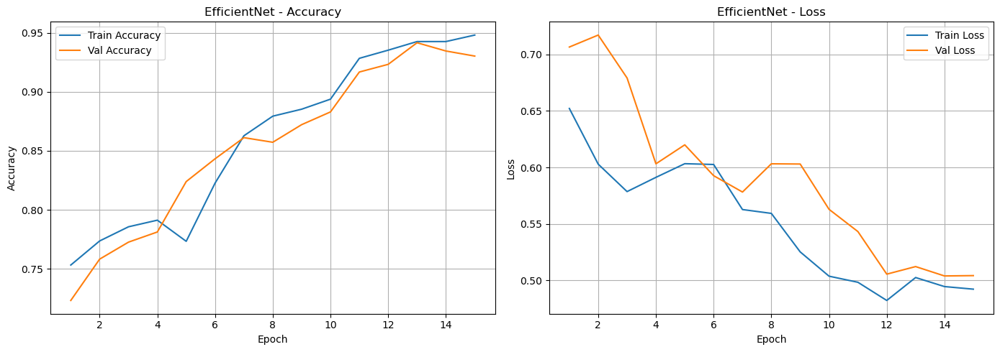

In [13]:
plot_training_history(history, model_name='EfficientNet')

In [14]:
test_generator.reset()
preds = model.predict(test_generator)
y_pred = (preds > 0.5).astype(int)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print("Classification Report on Test Set:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

176/176 [==============================] - 23s 121ms/step
Classification Report on Test Set:

              precision    recall  f1-score   support

     Cracked       0.91      0.92      0.92       849
 Non-cracked       0.95      0.94      0.94      4761

    accuracy                           0.9373     5610
   macro avg       0.93      0.93      0.93      5610
weighted avg       0.94      0.94      0.94      5610


In [15]:
evaluate_inference_performance(model, test_generator)

176/176 [==============================] - 42s 238ms/step

 Inference Performance Summary:
Total prediction time     : 19.00 seconds
Average time per image    : 0.0037 seconds/image
Memory used (psutil)      : 0.11 MB
Peak memory (tracemalloc) : 56.92 MB


### 3. VGG16 model with preprocessing

In [2]:
base_dir = './datapreprocessing_split'
img_size = (224, 224)
batch_size = 2
epochs = 15

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    os.path.join(base_dir, 'train'),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary'
)

val_generator = val_test_datagen.flow_from_directory(
    os.path.join(base_dir, 'val'),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary'
)

test_generator = val_test_datagen.flow_from_directory(
    os.path.join(base_dir, 'test'),
    target_size=img_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)


labels = train_generator.classes
class_weights = compute_class_weight(class_weight='balanced',
                                     classes=np.unique(labels),
                                     y=labels)
class_weights_dict = dict(enumerate(class_weights))
print("Class Weights:", class_weights_dict)

Found 39263 images belonging to 2 classes.
Found 11219 images belonging to 2 classes.
Found 5610 images belonging to 2 classes.
Class Weights: {0: 3.306079488043112, 1: 0.5890922730682671}


In [129]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False 

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [31]:
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    class_weight=class_weights_dict
)

Epoch 1/15
1227/1227 [==============================] - 445s 358ms/step - loss: 0.5603 - accuracy: 0.7573 - val_loss: 0.5032 - val_accuracy: 0.7913
Epoch 2/15
1227/1227 [==============================] - 438s 357ms/step - loss: 0.5072 - accuracy: 0.7755 - val_loss: 0.5273 - val_accuracy: 0.7823
Epoch 3/15
1227/1227 [==============================] - 440s 359ms/step - loss: 0.4873 - accuracy: 0.7820 - val_loss: 0.4572 - val_accuracy: 0.8027
Epoch 4/15
1227/1227 [==============================] - 441s 359ms/step - loss: 0.4783 - accuracy: 0.7932 - val_loss: 0.4672 - val_accuracy: 0.8284
Epoch 5/15
1227/1227 [==============================] - 443s 361ms/step - loss: 0.4393 - accuracy: 0.8293 - val_loss: 0.4652 - val_accuracy: 0.8393
Epoch 6/15
1227/1227 [==============================] - 437s 356ms/step - loss: 0.3692 - accuracy: 0.8572 - val_loss: 0.3362 - val_accuracy: 0.8425
Epoch 7/15
1227/1227 [==============================] - 437s 356ms/step - loss: 0.3043 - accuracy: 0.8923 - val_

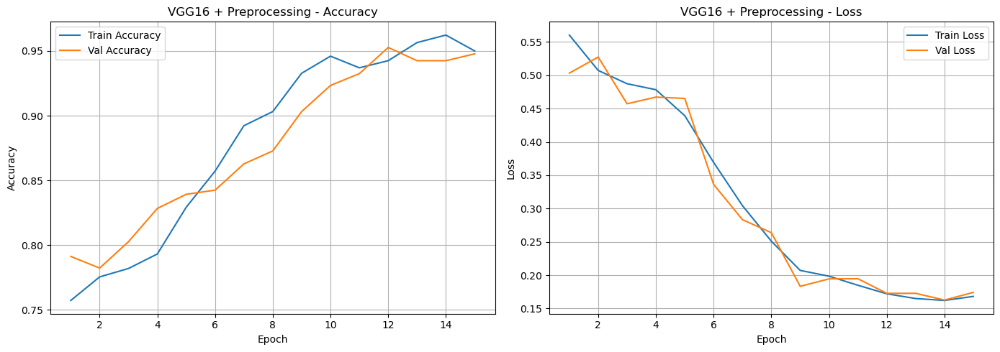

In [32]:
plot_training_history(history, model_name='VGG16 + Preprocessing')

In [33]:
test_generator.reset()
preds = model.predict(test_generator)
y_pred = (preds > 0.5).astype(int)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print("Classification Report on Test Set:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

176/176 [==============================] - 48s 274ms/step
Classification Report on Test Set:

              precision    recall  f1-score   support

     Cracked       0.90      0.91      0.91       849
 Non-cracked       0.96      0.95      0.96      4761

    accuracy                           0.94      5610
   macro avg       0.93      0.93      0.93      5610
weighted avg       0.94      0.94      0.94      5610


In [34]:
evaluate_inference_performance(model, test_generator)

176/176 [==============================] - 42s 238ms/step

 Inference Performance Summary:
Total prediction time     : 53.29 seconds
Average time per image    : 0.0089 seconds/image
Memory used (psutil)      : 0.23 MB
Peak memory (tracemalloc) : 77.35 MB


## 4. Proposed Model: EfficientNet Model with preprocessing

In [5]:
def build_model(hp):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

    # Freeze all layers first
    for layer in base_model.layers:
        layer.trainable = False

    # Unfreeze last N layers based on tuning
    unfreeze_layers = hp.Int('unfreeze_layers', min_value=0, max_value=len(base_model.layers), step=100)
    for layer in base_model.layers[-unfreeze_layers:]:
        layer.trainable = True

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(hp.Int('dense_units', min_value=64, max_value=256, step=64), activation='relu')(x)
    x = Dropout(hp.Float('dropout', min_value=0.3, max_value=0.6, step=0.1))(x)
    output = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=output)

    optimizer_choice = hp.Choice('optimizer', ['adam', 'rmsprop', 'sgd'])
    lr = hp.Float('lr', 1e-5, 1e-3, sampling='log')

    if optimizer_choice == 'adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_choice == 'rmsprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr, momentum=0.9)

    model.compile(optimizer=optimizer,
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model


In [6]:
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='effnetb7_tuning',
    project_name='crack_detection'
)

tuner.search(x=train_generator, 
             validation_data=val_generator,
             epochs=5,
             class_weight=class_weights_dict,
             callbacks=[tf.keras.callbacks.EarlyStopping(patience=2)])

Reloading Tuner from effnetb7_tuning\crack_detection\tuner0.json


In [9]:
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0]']      

 block2a_project_conv (Conv2D)  (None, 56, 56, 24)   2304        ['block2a_se_excite[0][0]']      
                                                                                                  
 block2a_project_bn (BatchNorma  (None, 56, 56, 24)  96          ['block2a_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2b_expand_conv (Conv2D)   (None, 56, 56, 144)  3456        ['block2a_project_bn[0][0]']     
                                                                                                  
 block2b_expand_bn (BatchNormal  (None, 56, 56, 144)  576        ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_e

 block3b_expand_bn (BatchNormal  (None, 28, 28, 240)  960        ['block3b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3b_expand_activation (Act  (None, 28, 28, 240)  0          ['block3b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3b_dwconv (DepthwiseConv2  (None, 28, 28, 240)  6000       ['block3b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, 28, 28, 240)  960        ['block3b_dwconv[0][0]']         
 )        

 D)                                                              ']                               
                                                                                                  
 block4b_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block4b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block4b_activation (Activation  (None, 14, 14, 480)  0          ['block4b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
          

 block5a_activation (Activation  (None, 14, 14, 480)  0          ['block5a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5a_se_squeeze (GlobalAver  (None, 480)         0           ['block5a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     
                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_s

 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      
                                                                                                  
 block5c_se_excite (Multiply)   (None, 14, 14, 672)  0           ['block5c_activation[0][0]',     
                                                                  'block5c_se_expand[0][0]']      
                                                                                                  
 block5c_project_conv (Conv2D)  (None, 14, 14, 112)  75264       ['block5c_se_excite[0][0]']      
                                                                                                  
 block5c_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5c_d

 block6b_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6b_drop (Dropout)         (None, 7, 7, 192)    0           ['block6b_project_bn[0][0]']     
                                                                                                  
 block6b_add (Add)              (None, 7, 7, 192)    0           ['block6b_drop[0][0]',           
                                                                  'block6a_project_bn[0][0]']     
                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6b_add[0][0]']            
                                                                                                  
 block6c_e

 block6d_add (Add)              (None, 7, 7, 192)    0           ['block6d_drop[0][0]',           
                                                                  'block6c_add[0][0]']            
                                                                                                  
 block7a_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6d_add[0][0]']            
                                                                                                  
 block7a_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block7a_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7a_expand_activation (Act  (None, 7, 7, 1152)  0           ['block7a_expand_bn[0][0]']      
 ivation)                                                                                         
          

In [39]:
early_stop = EarlyStopping(patience=5, restore_best_weights=True)
history = best_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    callbacks=[early_stop],
    class_weight=class_weights_dict
)

Epoch 1/10
1227/1227 [==============================] - 415s 358ms/step - loss: 0.4521 - accuracy: 0.8276 - val_loss: 0.4462 - val_accuracy: 0.8527
Epoch 2/10
1227/1227 [==============================] - 423s 357ms/step - loss: 0.3021 - accuracy: 0.8526 - val_loss: 0.3273 - val_accuracy: 0.8826
Epoch 3/10
1227/1227 [==============================] - 410s 359ms/step - loss: 0.2537 - accuracy: 0.9178 - val_loss: 0.2383 - val_accuracy: 0.9232
Epoch 4/10
1227/1227 [==============================] - 411s 359ms/step - loss: 0.2038 - accuracy: 0.9573 - val_loss: 0.1922 - val_accuracy: 0.9684
Epoch 5/10
1227/1227 [==============================] - 413s 361ms/step - loss: 0.1573 - accuracy: 0.9893 - val_loss: 0.1373 - val_accuracy: 0.9728
Epoch 6/10
1227/1227 [==============================] - 417s 356ms/step - loss: 0.1193 - accuracy: 0.9812 - val_loss: 0.1372 - val_accuracy: 0.9765
Epoch 7/10
1227/1227 [==============================] - 417s 356ms/step - loss: 0.1183 - accuracy: 0.9826 - val_

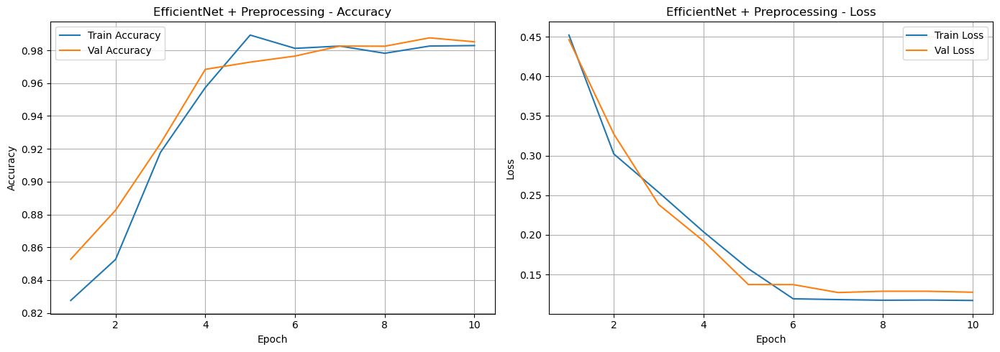

In [41]:
plot_training_history(history, model_name='EfficientNet + Preprocessing')

In [35]:
test_generator.reset()
preds = best_model.predict(test_generator)
y_pred = (preds > 0.5).astype(int)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

print("Classification Report on Test Set:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

2805/2805 [==============================] - 45s 15ms/step
Classification Report on Test Set:

              precision    recall  f1-score   support

     Cracked       0.96      0.97      0.96       849
 Non-cracked       0.99      0.98      0.99      4761

    accuracy                           0.98      5610
   macro avg       0.98      0.98      0.98      5610
weighted avg       0.98      0.98      0.98      5610


In [36]:
evaluate_inference_performance(model, test_generator)

176/176 [==============================] - 42s 238ms/step

 Inference Performance Summary:
Total prediction time     : 20.00 seconds
Average time per image    : 0.0040 seconds/image
Memory used (psutil)      : 0.13 MB
Peak memory (tracemalloc) : 58.76 MB


### Performance Comparision

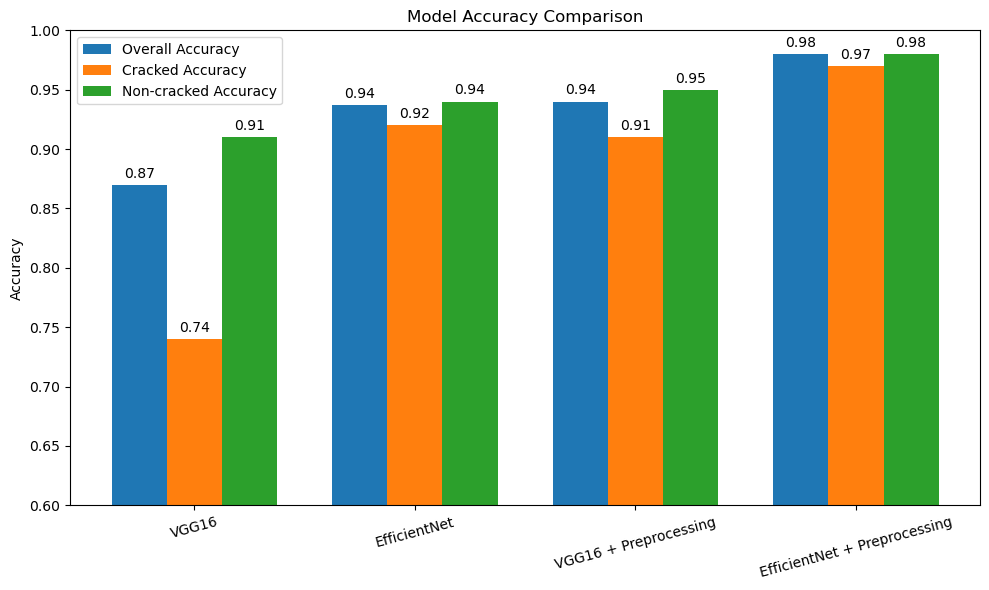

In [6]:
# Model results
models = [
    "VGG16",
    "EfficientNet",
    "VGG16 + Preprocessing",
    "EfficientNet + Preprocessing"
]

# Overall accuracy
overall_accuracy = [0.87, 0.9373, 0.94, 0.98]

# Cracked accuracy (recall)
cracked_accuracy = [0.74, 0.92, 0.91, 0.97]

# Non-cracked accuracy (recall)
non_cracked_accuracy = [0.91, 0.94, 0.95, 0.98]

x = np.arange(len(models))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6))
bar1 = ax.bar(x - width, overall_accuracy, width, label='Overall Accuracy')
bar2 = ax.bar(x, cracked_accuracy, width, label='Cracked Accuracy')
bar3 = ax.bar(x + width, non_cracked_accuracy, width, label='Non-cracked Accuracy')

ax.set_ylabel('Accuracy')
ax.set_ylim(0.6, 1.0)
ax.set_title('Model Accuracy Comparison')
ax.set_xticks(x)
ax.set_xticklabels(models, rotation=15)
ax.legend()

# Annotate bars
for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

plt.tight_layout()
plt.show()


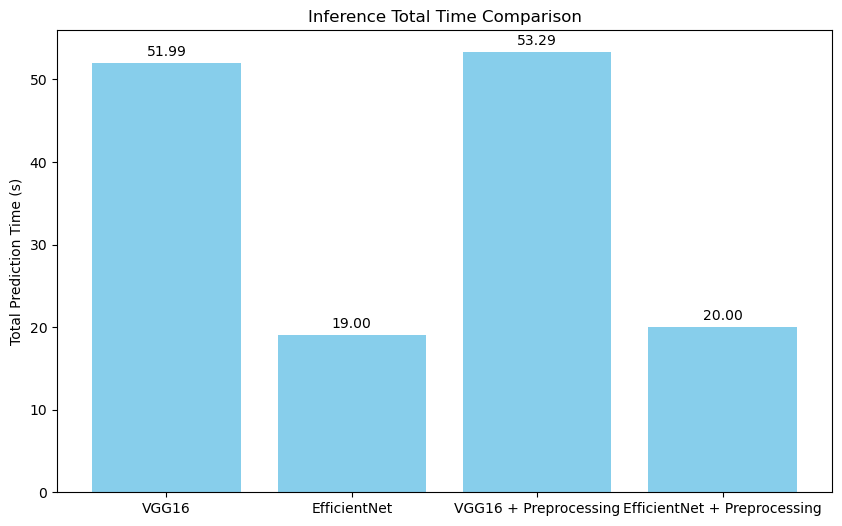

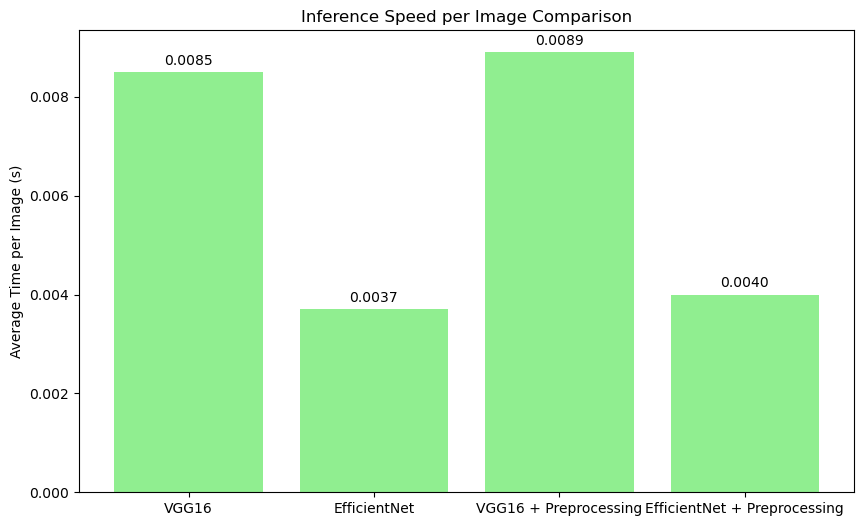

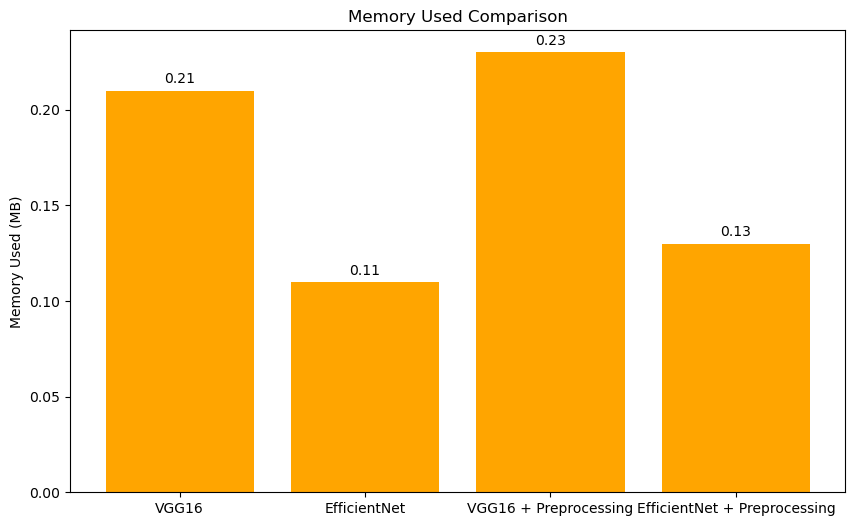

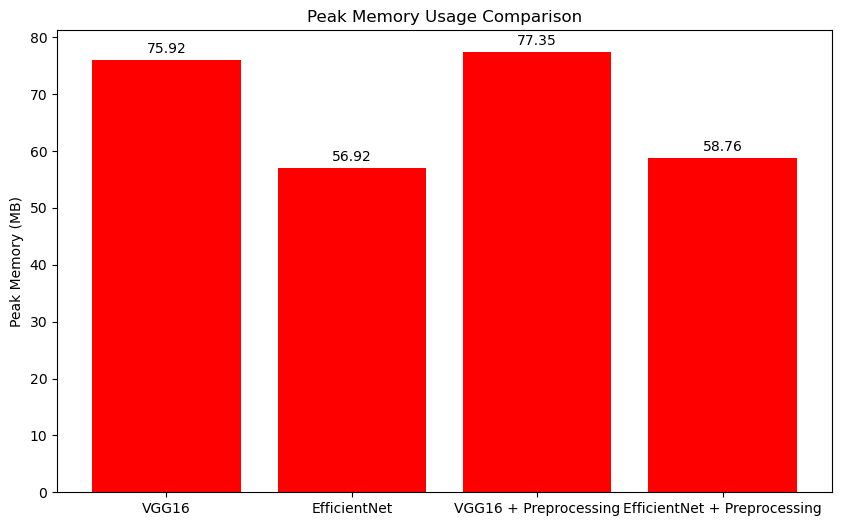

In [1]:
models = ["VGG16", "EfficientNet", "VGG16 + Preprocessing", "EfficientNet + Preprocessing"]

# Total prediction time (seconds)
total_time = [51.99, 19.00, 53.29, 20.00]

# Average time per image (seconds/image)
avg_time_per_image = [0.0085, 0.0037, 0.0089, 0.0040]

# Memory used (MB)
memory_used = [0.21, 0.11, 0.23, 0.13]

# Peak memory (MB)
peak_memory = [75.92, 56.92, 77.35, 58.76]

# --- Total time plot ---
plt.figure(figsize=(10,6))
bars = plt.bar(models, total_time, color='skyblue')
plt.ylabel("Total Prediction Time (s)")
plt.title("Inference Total Time Comparison")
for bar in bars:
    height = bar.get_height()
    plt.annotate(f"{height:.2f}", xy=(bar.get_x() + bar.get_width()/2, height),
                 xytext=(0, 3), textcoords="offset points",
                 ha='center', va='bottom')
plt.show()

# --- Avg time per image plot ---
plt.figure(figsize=(10,6))
bars = plt.bar(models, avg_time_per_image, color='lightgreen')
plt.ylabel("Average Time per Image (s)")
plt.title("Inference Speed per Image Comparison")
for bar in bars:
    height = bar.get_height()
    plt.annotate(f"{height:.4f}", xy=(bar.get_x() + bar.get_width()/2, height),
                 xytext=(0, 3), textcoords="offset points",
                 ha='center', va='bottom')
plt.show()

# --- Memory used plot ---
plt.figure(figsize=(10,6))
bars = plt.bar(models, memory_used, color='orange')
plt.ylabel("Memory Used (MB)")
plt.title("Memory Used Comparison")
for bar in bars:
    height = bar.get_height()
    plt.annotate(f"{height:.2f}", xy=(bar.get_x() + bar.get_width()/2, height),
                 xytext=(0, 3), textcoords="offset points",
                 ha='center', va='bottom')
plt.show()

# --- Peak memory plot ---
plt.figure(figsize=(10,6))
bars = plt.bar(models, peak_memory, color='red')
plt.ylabel("Peak Memory (MB)")
plt.title("Peak Memory Usage Comparison")
for bar in bars:
    height = bar.get_height()
    plt.annotate(f"{height:.2f}", xy=(bar.get_x() + bar.get_width()/2, height),
                 xytext=(0, 3), textcoords="offset points",
                 ha='center', va='bottom')
plt.show()


## Prediction of image

1/1 [==============================] - 0s 29ms/step


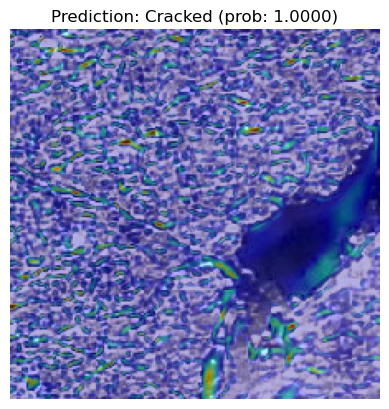

In [11]:
img_path = "./datapreprocessing_split/test/Cracked/005-83.jpg"
img = image.load_img(img_path, target_size=(224, 224))  
img_array = image.img_to_array(img)
img_batch = np.expand_dims(img_array, axis=0)
img_batch = preprocess_input(img_batch)

prediction = best_model.predict(img_batch)

if prediction[0][0] > 0.5:
    label = f"Prediction: Cracked (prob: {prediction[0][0]:.4f})"
else:
    label = f"Prediction: Not Cracked (prob: {1 - prediction[0][0]:.4f})"
plt.imshow(img_array.astype("uint8"))
plt.title(label)
plt.axis("off")
plt.show()
